### 06 - Qualitative analysis - exp_003 and exp_005

exp_003: visual ON and position ON

exp_005: visual OFF and position OFF

We define two situations:

- situation 1: exp_003 prediction = 1 and exp_005 prediction = 0<br>
- situation 2: exp_003 prediction = 1 and exp_005 prediction = 1


##### Hypotheses:

- 1A: the predicted bbox in exp_005 was too hard to describe using the existing text.

- 2A: the text for describing the bbox ground truth is overspescified.

In [2]:
import torch
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from PIL import Image
from torchvision.ops import box_iou

from rec.utils import draw_bounding_boxes

pd.set_option('display.max_colwidth', None)

In [3]:
BASE_PATH = "../code/rec/"

In [4]:
def get_concat_h(im1, im2):
    dst = Image.new('RGB', (im1.width + im2.width, max(im1.height, im2.height)))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst


def get_iou_column(df, bbox_pred_colname="bbox_pred"):
    df.loc[:, "bbox_raw"] = df.bbox_raw.apply(lambda v: np.resize(v, (1, 4)))
    df.loc[:, bbox_pred_colname] = df[bbox_pred_colname].apply(lambda v: np.resize(v, (1, 4)))
    df.loc[:, "iou"] = df.apply(lambda row: box_iou(torch.from_numpy(row[bbox_pred_colname]),
                                                    torch.from_numpy(row["bbox_raw"])), axis=1)
    df = df.astype({"iou": float})
    return df

### Read validation data from all available experiments results

In [5]:
exp_d = {
    "exp_003": [
        ["exp_003", "predictions_val.parquet", True, True],
    ],
    "exp_005": [
        ["exp_005", "predictions_val_2023_11_05_23_58.parquet", False, False],
    ],
}
exp_descriptions = {
    "exp_003": "Exp from the section 3.1 of the paper.",
    "exp_005": "Exp from the section 3.1 of the paper, visual position embedding OFF, visual embedding OFF.",
}

In [6]:
df_preds_list = []
for exp_base, lst_exps in exp_d.items():
    exp_base_description = exp_descriptions[exp_base]
    for exp_number, exp_filename, use_visual_pos_emb, use_visual_emb in lst_exps:
        df = pd.read_parquet(f"../models/{exp_number}/{exp_filename}")
        df.loc[:, "exp_number"] = exp_number
        df.loc[:, "exp_description"] = exp_base_description
        df = get_iou_column(df)
        df = df.rename(columns={"hits": "hits_50"})
        df_preds_list.append(df)
df_preds_val = pd.concat(df_preds_list, ignore_index=True)

In [7]:
df_preds_val.head()

,bbox_raw,bbox_pred,img_filename,expr,hits_50,spatial,ordinal,relational,intrinsic,exp_number,exp_description,iou
0,"[[156.0, 169.0, 224.0, 360.0]]","[[151.18057, 165.33563, 211.10284, 359.0]]",refer/data/images/saiapr_tc-12/10/images/10890.jpg,person on the left,1.0,1,0,0,0,exp_003,Exp from the section 3.1 of the paper.,0.741297
1,"[[0.0, 94.0, 480.0, 360.0]]","[[19.449877, 49.38504, 479.0, 359.0]]",refer/data/images/saiapr_tc-12/03/images/3593.jpg,the trees,1.0,0,0,0,1,exp_003,Exp from the section 3.1 of the paper.,0.821828
2,"[[110.0, 64.0, 296.0, 183.0]]","[[43.807602, 8.283485, 277.42676, 169.42986]]",refer/data/images/saiapr_tc-12/03/images/3593.jpg,sky next to clouds,0.0,1,0,1,0,exp_003,Exp from the section 3.1 of the paper.,0.418993
3,"[[201.0, 49.0, 331.0, 184.0]]","[[175.06863, 75.22853, 302.1217, 181.43765]]",refer/data/images/saiapr_tc-12/03/images/3593.jpg,clouds,1.0,0,0,0,1,exp_003,Exp from the section 3.1 of the paper.,0.528958
4,"[[176.0, 56.0, 478.0, 195.0]]","[[196.47316, 66.93359, 479.0, 192.50998]]",refer/data/images/saiapr_tc-12/03/images/3593.jpg,mountain,1.0,0,0,0,1,exp_003,Exp from the section 3.1 of the paper.,0.839670


Let's analyze the differences in some samples.

In [8]:
cols = [
    'bbox_raw',
    'bbox_pred',
    'img_filename',
    'expr',
    'hits_50',
    'spatial',
    'ordinal',
    'relational',
    'intrinsic',
    'iou',
]

In [9]:
df_preds_val_sub = pd.concat([
    (
        df_preds_val
        .query("exp_number == 'exp_003'")
        .reset_index(drop=True)
        .loc[:, cols]
        .rename(columns={"iou": "iou_003", "hits_50": "hits_50_003", "bbox_pred": "bbox_pred_003"})
    ),
    (
        df_preds_val
        .query("exp_number == 'exp_005'")
        .reset_index(drop=True)
        .loc[:, ["iou", "hits_50", "bbox_pred"]]
        .rename(columns={"iou": "iou_005", "hits_50": "hits_50_005", "bbox_pred": "bbox_pred_005"})
    ),
    ], axis=1
)
df_preds_val_sub = (
    df_preds_val_sub
    .astype({"hits_50_003": "int", "hits_50_005": "int"})
    .loc[:, ["img_filename", "bbox_raw", "expr", "spatial",
             "ordinal", "relational", "intrinsic", "hits_50_003",
             "hits_50_005", "iou_003", "iou_005", "bbox_pred_003", "bbox_pred_005"]]
)

## Situation 1: exp_003 pred = 1 and exp_005 pred = 0

In [10]:
df_situation_1 = df_preds_val_sub.query("hits_50_003 == 1 and hits_50_005 == 0").reset_index(drop=True)

In [10]:
df_situation_1.head()

,img_filename,bbox_raw,expr,spatial,ordinal,relational,intrinsic,hits_50_003,hits_50_005,iou_003,iou_005,bbox_pred_003,bbox_pred_005
0,refer/data/images/saiapr_tc-12/10/images/10890.jpg,"[[156.0, 169.0, 224.0, 360.0]]",person on the left,1,0,0,0,1,0,0.741297,0.078396,"[[151.18057, 165.33563, 211.10284, 359.0]]","[[13.492269, 93.61717, 177.71883, 357.56363]]"
1,refer/data/images/saiapr_tc-12/03/images/3593.jpg,"[[0.0, 94.0, 480.0, 360.0]]",the trees,0,0,0,1,1,0,0.821828,0.397644,"[[19.449877, 49.38504, 479.0, 359.0]]","[[2.3638628, 0.0, 472.3574, 239.40369]]"
2,refer/data/images/saiapr_tc-12/03/images/3593.jpg,"[[201.0, 49.0, 331.0, 184.0]]",clouds,0,0,0,1,1,0,0.528958,0.156871,"[[175.06863, 75.22853, 302.1217, 181.43765]]","[[3.5244367, 0.0, 473.2536, 131.96236]]"
3,refer/data/images/saiapr_tc-12/03/images/3593.jpg,"[[176.0, 56.0, 478.0, 195.0]]",mountain,0,0,0,1,1,0,0.839670,0.398696,"[[196.47316, 66.93359, 479.0, 192.50998]]","[[10.105776, 1.5729141, 464.45734, 218.77103]]"
4,refer/data/images/saiapr_tc-12/30/images/30774.jpg,"[[128.0, 159.0, 181.0, 462.0]]",person,0,0,0,1,1,0,0.613369,0.209341,"[[105.71649, 159.31729, 192.03384, 461.79974]]","[[39.927094, 140.24675, 269.40817, 424.5003]]"


In [16]:
df_situation_1[["intrinsic", "relational", "spatial", "ordinal"]].value_counts()

intrinsic  relational  spatial  ordinal
0          0           1        0          1245
1          0           0        0           889
0          1           1        0           422
           0           1        1            26
                       0        1             6
           1           1        1             2
dtype: int64

In [15]:
df_situation_1[["intrinsic", "relational", "spatial", "ordinal"]].value_counts(normalize=True)

intrinsic  relational  spatial  ordinal
0          0           1        0          0.480695
1          0           0        0          0.343243
0          1           1        0          0.162934
           0           1        1          0.010039
                       0        1          0.002317
           1           1        1          0.000772
dtype: float64

#### Relational

In [17]:
df_situation_1.query("relational == 1 and ordinal == 0").loc[:, ["spatial", "relational", "ordinal", "intrinsic"]].sum()

spatial       422
relational    422
ordinal         0
intrinsic       0
dtype: int64

lady in red shirt


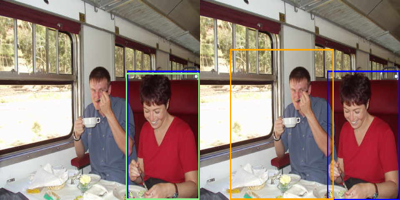

window to right of tree


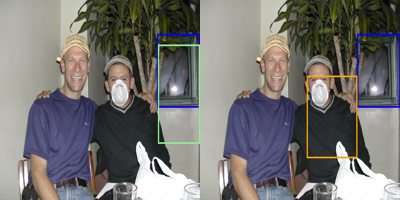

the plant in front of the animal


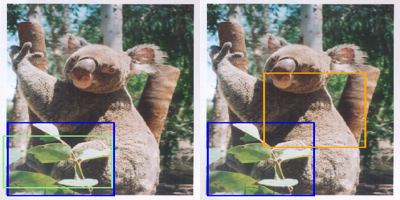

patch of road on the left side


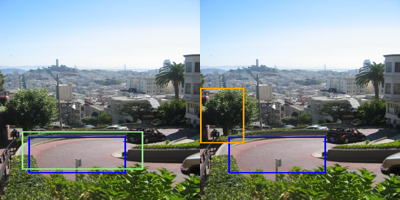

hat on guy on left


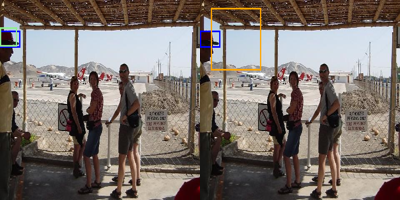

mountain on right just below skyline


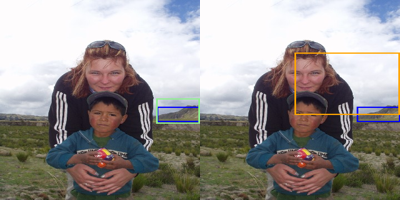

water to left of left most tree


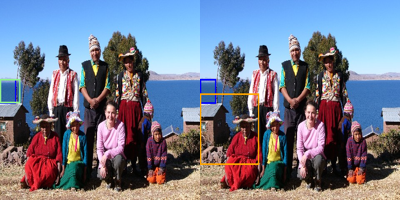

person in grey with a black bag


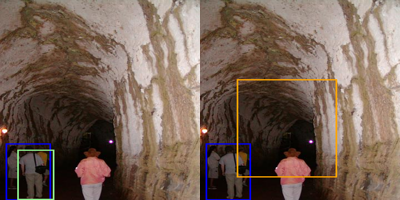

green food in dish


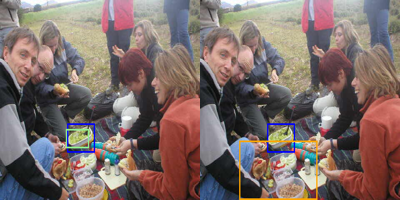

lady in the bikini


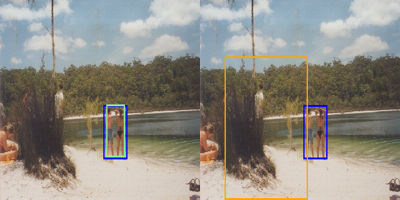

dat window above her head


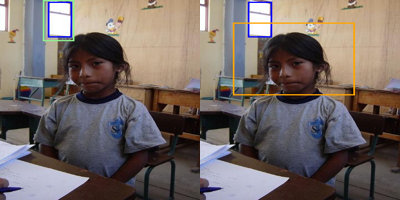

grass on left mid


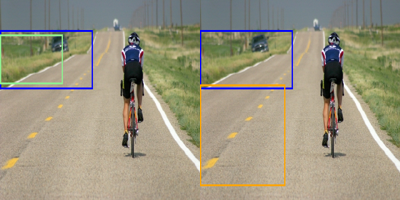

In [18]:
df = df_situation_1.query("relational == 1 and ordinal == 0")
resize_tuple = (200, 200)
df_sample_cls = df.query("0 < iou_005 <= 0.1")
df_sample_cls = df_sample_cls.sample(min(12, df_sample_cls.shape[0]), random_state=77)
for _, row in df_sample_cls.loc[:, ["bbox_raw", "bbox_pred_003", "bbox_pred_005", "img_filename", "expr"]].iterrows():
    im = Image.open(f"{BASE_PATH}{row['img_filename']}")
    im = draw_bounding_boxes(im, [row['bbox_raw']], fmt="xyxy", color="blue", line_width=3)
    im2 = im.copy()
    im = draw_bounding_boxes(im, [row['bbox_pred_003']], fmt="xyxy", color="lightgreen", line_width=3)
    im2 = draw_bounding_boxes(im2, [row['bbox_pred_005']], fmt="xyxy", color="orange", line_width=3)
    im = im.resize(resize_tuple)
    im2 = im2.resize(resize_tuple)
    print(row['expr'])
    get_concat_h(im, im2).show()

### Spatial pure

anyone of the 4 round bushes dead ahead


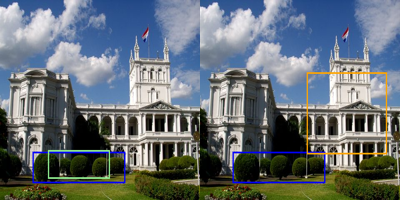

person on the left


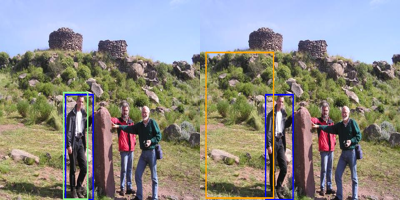

girl right


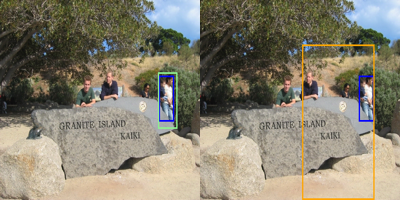

guy in blue


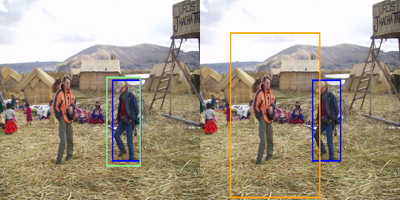

guy dark shirt close tu u


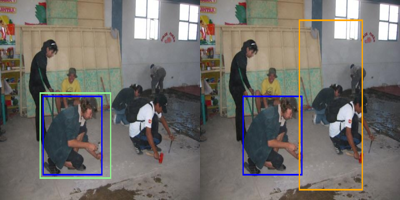

left door


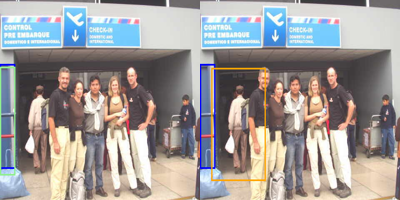

water on the right


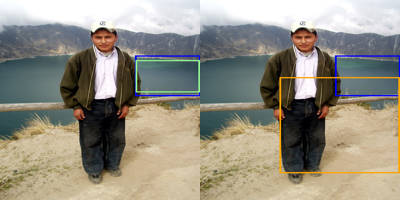

lonely cloud on the right


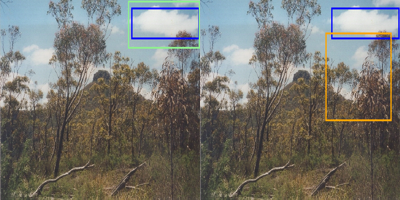

surfboard very middle


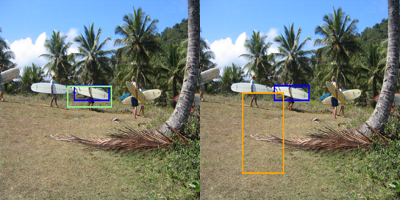

water to the left


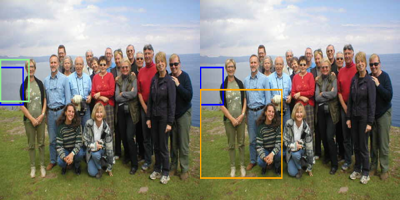

green to the right of guy


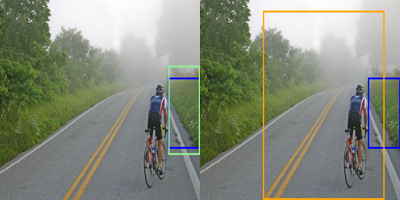

blue sky top right corner


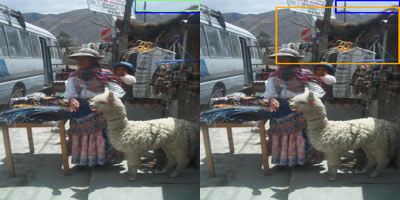

forklift on right


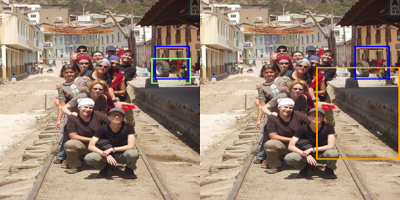

bottom right


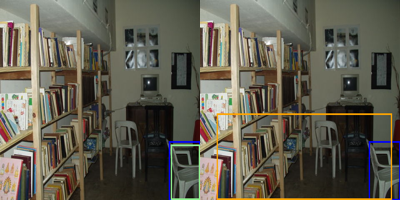

person bottom center


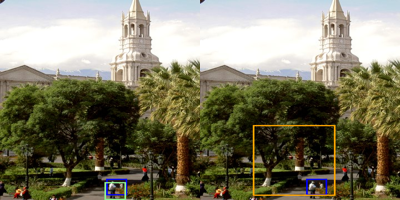

break in sidewalk


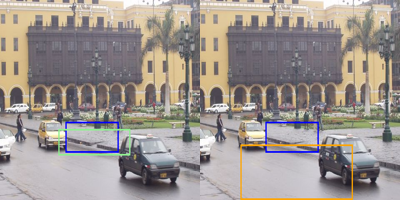

cloud left


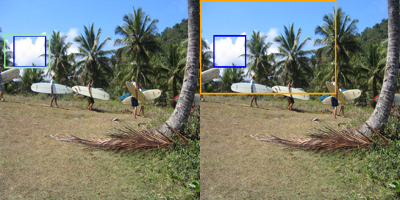

bike all the way right side


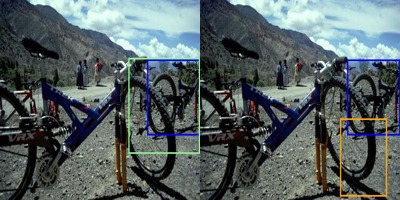

water on the right


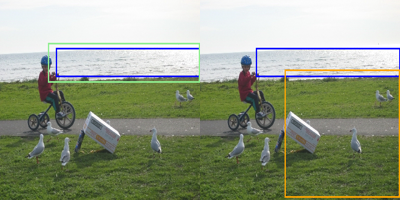

plate at bottom on the right


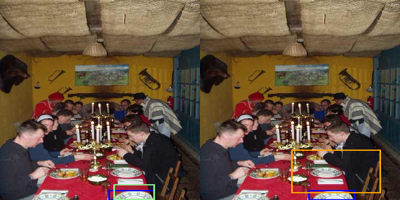

In [21]:
df = df_situation_1.query("spatial == 1 and ordinal == 0 and intrinsic == 0 and relational == 0")
resize_tuple = (200, 200)
df_sample_cls = df.query("0 < iou_005 <= 0.1")
df_sample_cls = df_sample_cls.sample(min(20, df_sample_cls.shape[0]), random_state=45)
for _, row in df_sample_cls.loc[:, ["bbox_raw", "bbox_pred_003", "bbox_pred_005", "img_filename", "expr"]].iterrows():
    im = Image.open(f"{BASE_PATH}{row['img_filename']}")
    im = draw_bounding_boxes(im, [row['bbox_raw']], fmt="xyxy", color="blue", line_width=3)
    im2 = im.copy()
    im = draw_bounding_boxes(im, [row['bbox_pred_003']], fmt="xyxy", color="lightgreen", line_width=3)
    im2 = draw_bounding_boxes(im2, [row['bbox_pred_005']], fmt="xyxy", color="orange", line_width=3)
    im = im.resize(resize_tuple)
    im2 = im2.resize(resize_tuple)
    print(row['expr'])
    get_concat_h(im, im2).show()

### Ordinal pure.

first horse


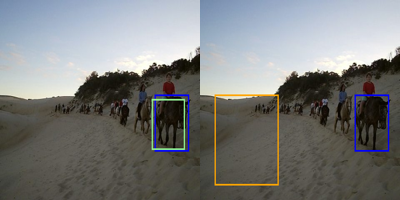

first window


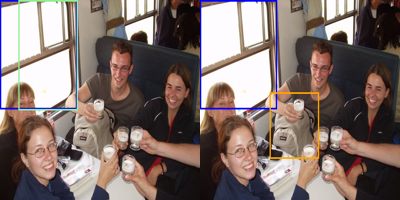

fourth person


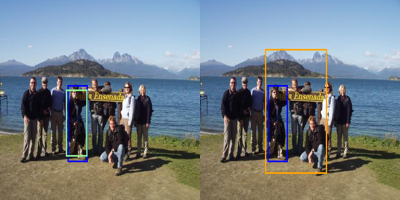

first horse


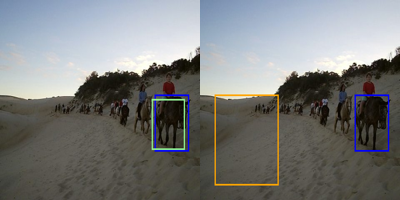

2nd story 1st window


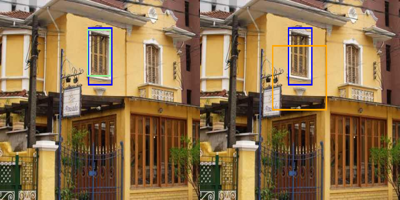

the first horse


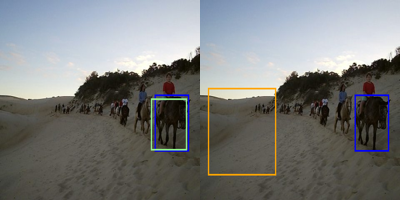

In [26]:
df = df_situation_1.query("ordinal == 1 and spatial == 0 and relational == 0 and intrinsic == 0")
resize_tuple = (200, 200)
# df_sample_cls = df.query("0 < iou_005 <= 0.1")
df_sample_cls = df.sample(min(12, df.shape[0]), random_state=77)
for _, row in df_sample_cls.loc[:, ["bbox_raw", "bbox_pred_003", "bbox_pred_005", "img_filename", "expr"]].iterrows():
    im = Image.open(f"{BASE_PATH}{row['img_filename']}")
    im = draw_bounding_boxes(im, [row['bbox_raw']], fmt="xyxy", color="blue", line_width=3)
    im2 = im.copy()
    im = draw_bounding_boxes(im, [row['bbox_pred_003']], fmt="xyxy", color="lightgreen", line_width=3)
    im2 = draw_bounding_boxes(im2, [row['bbox_pred_005']], fmt="xyxy", color="orange", line_width=3)
    im = im.resize(resize_tuple)
    im2 = im2.resize(resize_tuple)
    print(row['expr'])
    get_concat_h(im, im2).show()

### Intrinsic pure

face


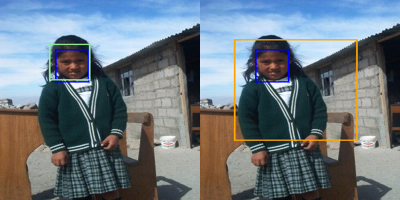

boat


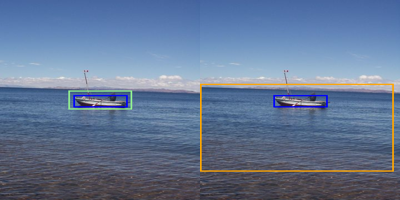

yellow door


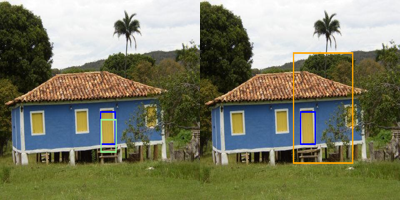

person swining


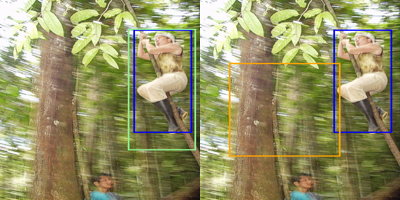

writing


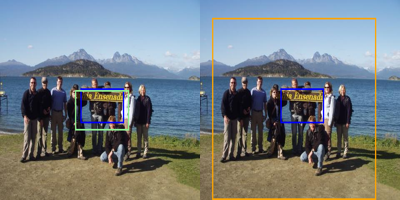

animal running


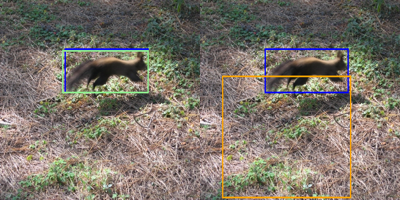

blue shirt


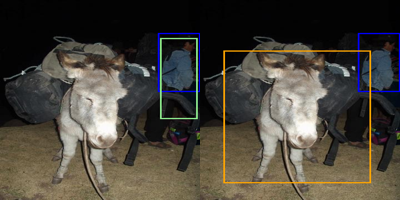

dis guy has an awesome hat . you should click it


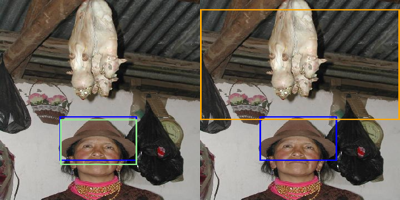

white seagull


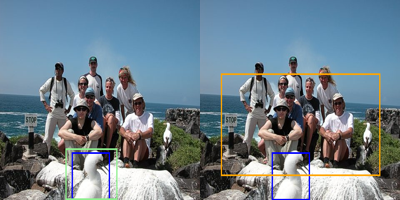

the car


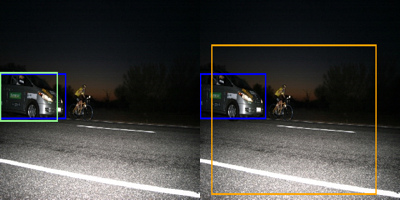

the camel


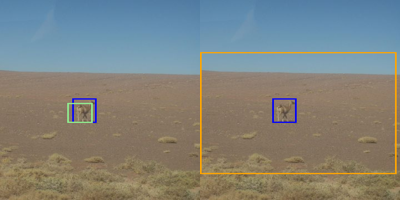

sikver car


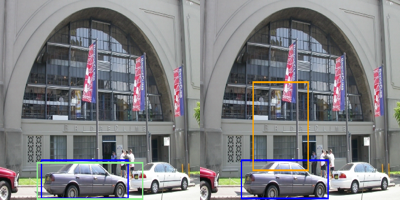

In [28]:
df = df_situation_1.query("intrinsic == 1 and ordinal == 0 and relational == 0 and spatial == 0")
resize_tuple = (200, 200)
df_sample_cls = df.query("0 < iou_005 <= 0.1")
df_sample_cls = df_sample_cls.sample(min(12, df_sample_cls.shape[0]), random_state=46)
for _, row in df_sample_cls.loc[:, ["bbox_raw", "bbox_pred_003", "bbox_pred_005", "img_filename", "expr"]].iterrows():
    im = Image.open(f"{BASE_PATH}{row['img_filename']}")
    im = draw_bounding_boxes(im, [row['bbox_raw']], fmt="xyxy", color="blue", line_width=3)
    im2 = im.copy()
    im = draw_bounding_boxes(im, [row['bbox_pred_003']], fmt="xyxy", color="lightgreen", line_width=3)
    im2 = draw_bounding_boxes(im2, [row['bbox_pred_005']], fmt="xyxy", color="orange", line_width=3)
    im = im.resize(resize_tuple)
    im2 = im2.resize(resize_tuple)
    print(row['expr'])
    get_concat_h(im, im2).show()

## Situation 2: exp_003 pred = 1 and exp_005 pred = 1

In [29]:
df_situation_2 = df_preds_val_sub.query("hits_50_003 == 1 and hits_50_005 == 1").reset_index(drop=True)

In [30]:
df_situation_2[["intrinsic", "relational", "spatial", "ordinal"]].value_counts()

intrinsic  relational  spatial  ordinal
1          0           0        0          1019
0          0           1        0           724
           1           1        0           160
           0           1        1             3
           1           1        1             2
dtype: int64

In [46]:
(
    df_situation_2
    .query("0.7 < iou_005 <= 1")
    [["intrinsic", "relational", "spatial", "ordinal"]].value_counts()
)

intrinsic  relational  spatial  ordinal
1          0           0        0          493
0          0           1        0          269
           1           1        0           61
           0           1        1            2
dtype: int64

In [32]:
df_situation_2[["intrinsic", "relational", "spatial", "ordinal"]].value_counts(normalize=True)

intrinsic  relational  spatial  ordinal
1          0           0        0          0.534067
0          0           1        0          0.379455
           1           1        0          0.083857
           0           1        1          0.001572
           1           1        1          0.001048
dtype: float64

### Relational

plants , bottom of screen


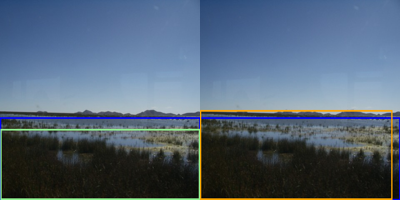

sky above his head


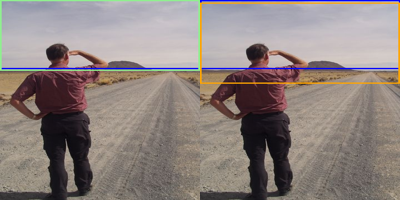

top half of wall , not the tapestries


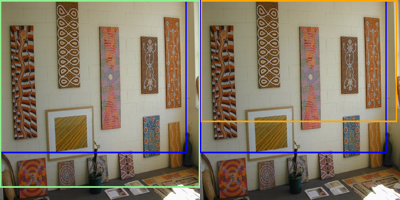

sand under chair


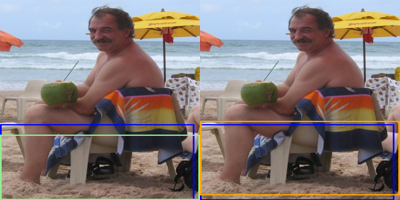

lol either wall on the left/right but only the tops


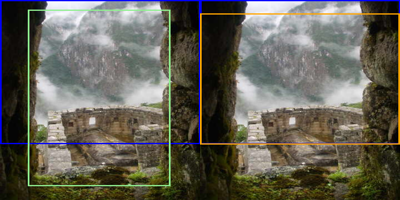

sky to right of sun


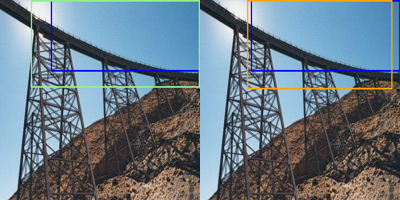

group of girls on the right


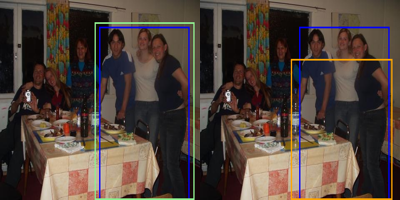

mountain just behind lake


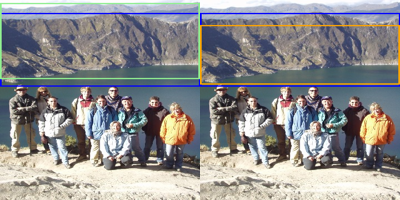

wall above bed


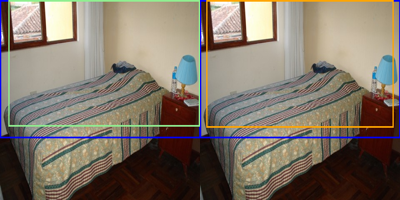

rocks under sky


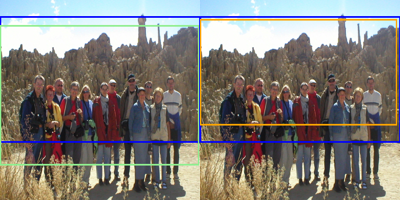

bottom half of photo


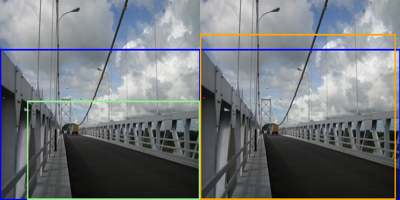

grass on bottom of photo


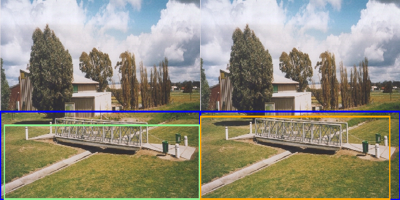

sky above bridge


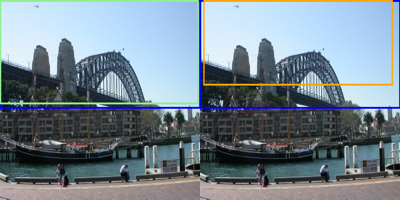

sand in front of pic


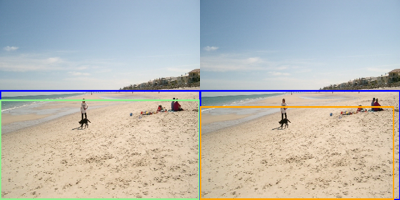

water front of picture


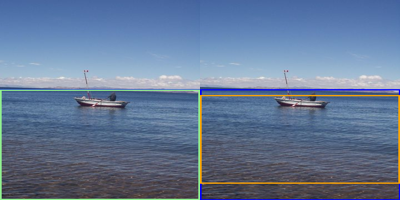

yay < 3 dat 's a lot of sky yo . it 's like , clickable and sh*t


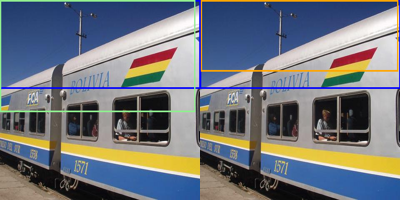

bottom half of photo


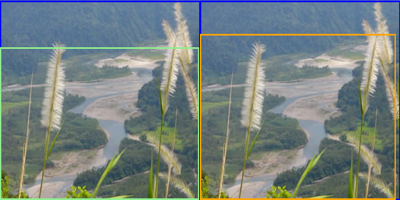

trees above the green water


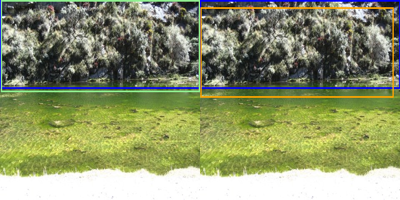

wall above black board


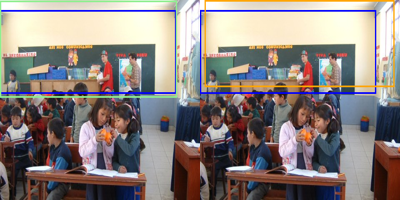

wall behind bed


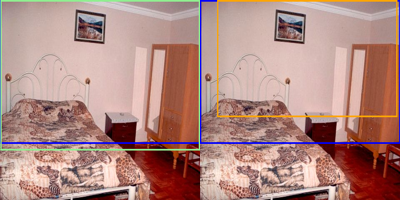

In [47]:
df = df_situation_2.query("relational == 1 and ordinal == 0 and intrinsic == 0")
resize_tuple = (200, 200)
df_sample_cls = df.query("0.7 < iou_005 <= 1")
df_sample_cls = df_sample_cls.sample(min(20, df_sample_cls.shape[0]), random_state=88)
for _, row in df_sample_cls.loc[:, ["bbox_raw", "bbox_pred_003", "bbox_pred_005", "img_filename", "expr"]].iterrows():
    im = Image.open(f"{BASE_PATH}{row['img_filename']}")
    im = draw_bounding_boxes(im, [row['bbox_raw']], fmt="xyxy", color="blue", line_width=3)
    im2 = im.copy()
    im = draw_bounding_boxes(im, [row['bbox_pred_003']], fmt="xyxy", color="lightgreen", line_width=3)
    im2 = draw_bounding_boxes(im2, [row['bbox_pred_005']], fmt="xyxy", color="orange", line_width=3)
    im = im.resize(resize_tuple)
    im2 = im2.resize(resize_tuple)
    print(row['expr'])
    get_concat_h(im, im2).show()

### Spatial pure

anywhere on her


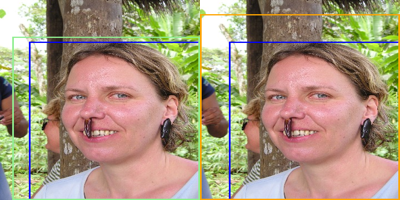

water top


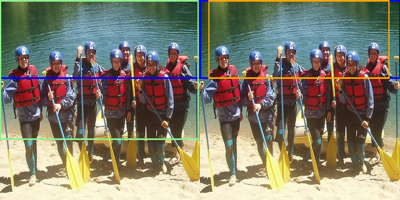

click anywhere in the blue sky


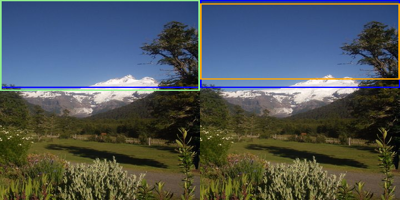

sky in the top right


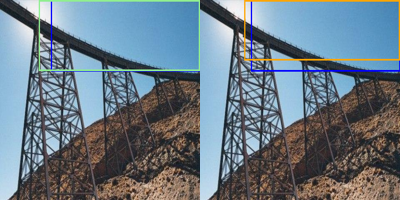

right wall


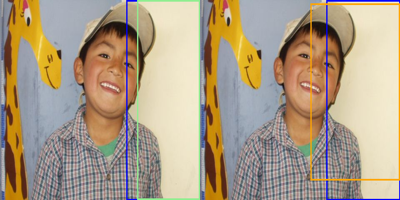

the bottom


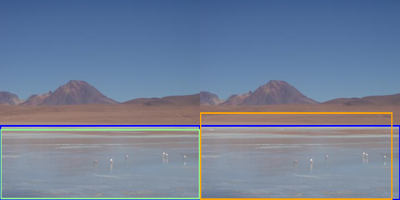

i right dumb . click not the child


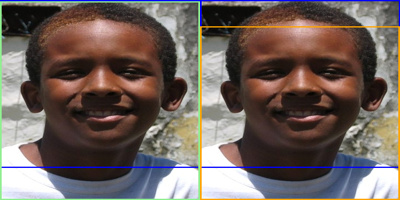

sidewalk around tree


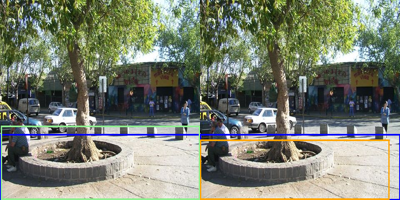

right above the people


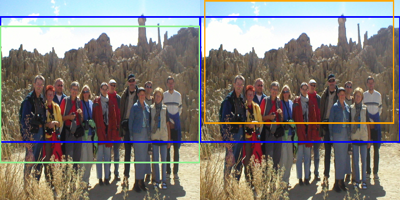

sky to the right


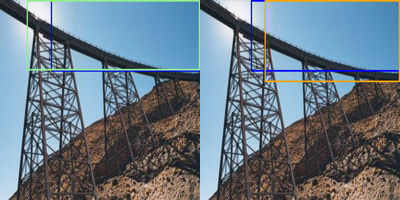

very bottom


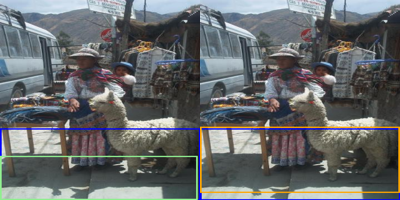

click bottom right corner no idea wtf this is


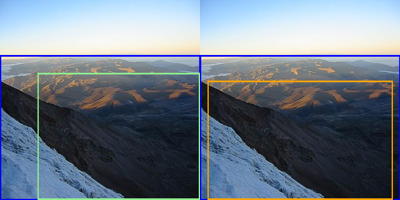

ground middle


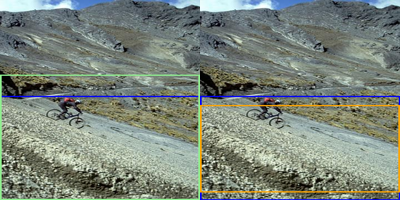

hills in the back


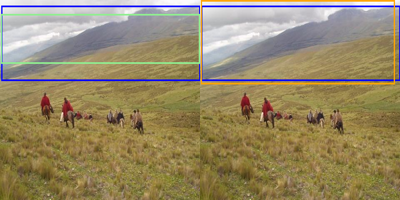

top half greenery


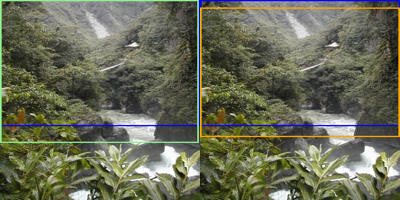

sky blue part


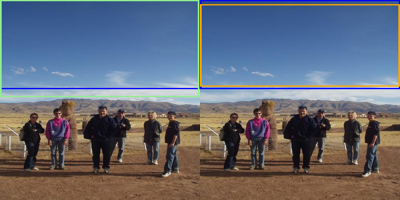

dirt in front


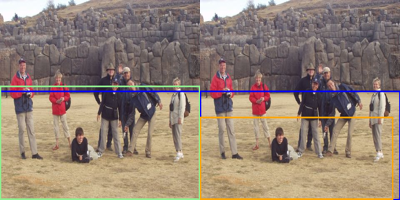

top left corner of sky


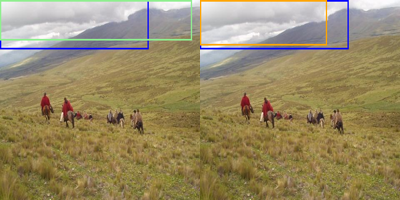

asian guy far left


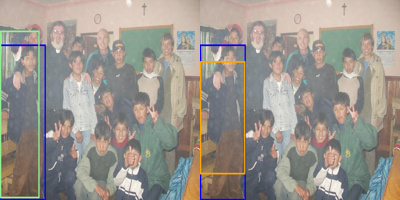

bed right


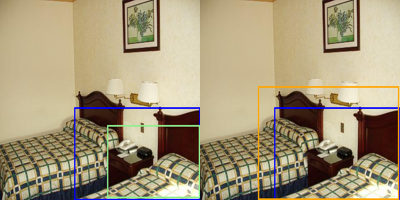

In [48]:
df = df_situation_2.query("spatial == 1 and relational == 0 and ordinal == 0 and intrinsic == 0")
resize_tuple = (200, 200)
df_sample_cls = df.query("0.7 < iou_005 <= 1")
df_sample_cls = df_sample_cls.sample(min(20, df_sample_cls.shape[0]), random_state=36)
for _, row in df_sample_cls.loc[:, ["bbox_raw", "bbox_pred_003", "bbox_pred_005", "img_filename", "expr"]].iterrows():
    im = Image.open(f"{BASE_PATH}{row['img_filename']}")
    im = draw_bounding_boxes(im, [row['bbox_raw']], fmt="xyxy", color="blue", line_width=3)
    im2 = im.copy()
    im = draw_bounding_boxes(im, [row['bbox_pred_003']], fmt="xyxy", color="lightgreen", line_width=3)
    im2 = draw_bounding_boxes(im2, [row['bbox_pred_005']], fmt="xyxy", color="orange", line_width=3)
    im = im.resize(resize_tuple)
    im2 = im2.resize(resize_tuple)
    print(row['expr'])
    get_concat_h(im, im2).show()

### Ordinal

second woman from right


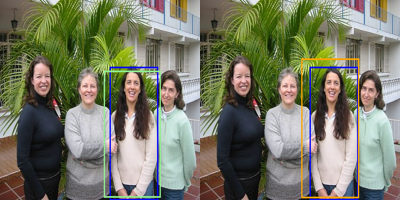

first skeleton in front


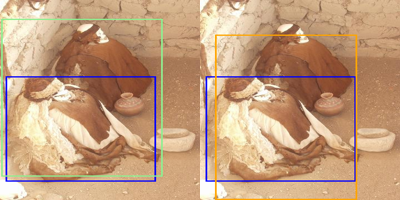

lower third of photo


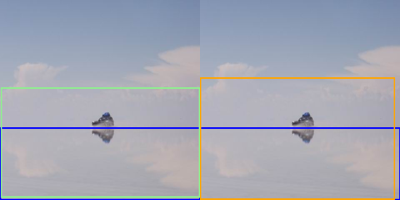

long hair woman second from right


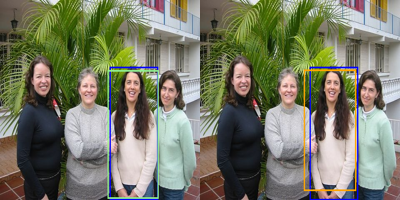

second shelf , far left set of books


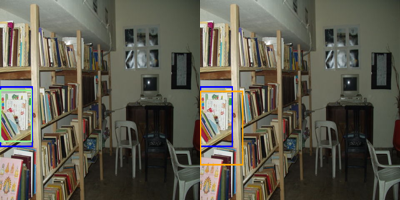

In [49]:
df = df_situation_2.query("ordinal == 1")
resize_tuple = (200, 200)
#df_sample_cls = df.query("0.8 < iou_005 <= 1")
df_sample_cls = df.sample(min(12, df.shape[0]), random_state=42)
for _, row in df_sample_cls.loc[:, ["bbox_raw", "bbox_pred_003", "bbox_pred_005", "img_filename", "expr"]].iterrows():
    im = Image.open(f"{BASE_PATH}{row['img_filename']}")
    im = draw_bounding_boxes(im, [row['bbox_raw']], fmt="xyxy", color="blue", line_width=3)
    im2 = im.copy()
    im = draw_bounding_boxes(im, [row['bbox_pred_003']], fmt="xyxy", color="lightgreen", line_width=3)
    im2 = draw_bounding_boxes(im2, [row['bbox_pred_005']], fmt="xyxy", color="orange", line_width=3)
    im = im.resize(resize_tuple)
    im2 = im2.resize(resize_tuple)
    print(row['expr'])
    get_concat_h(im, im2).show()

### Intrinsic pure

the road


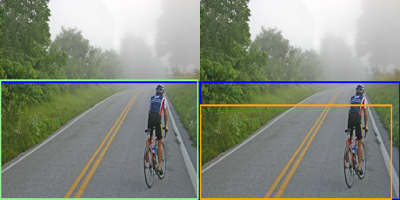

sky


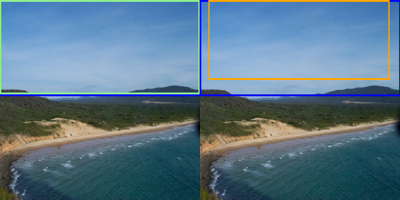

lady


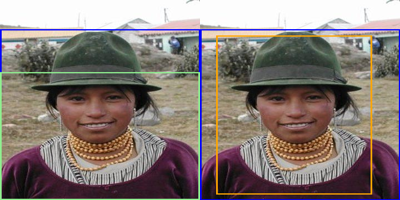

sand


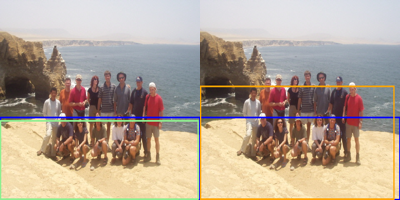

grass


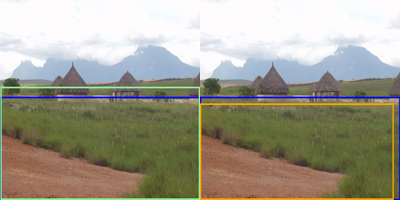

people


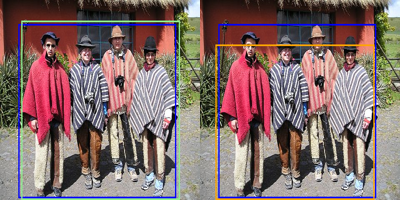

sky


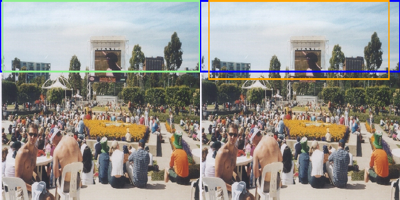

sky


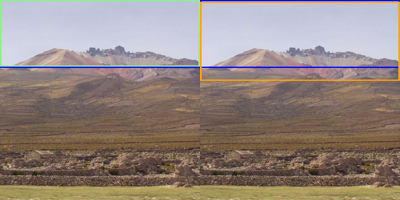

people


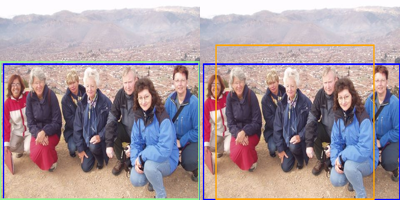

sky


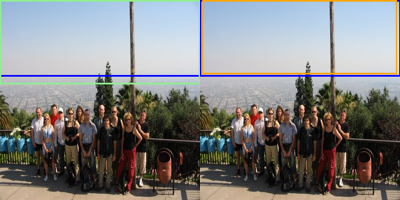

ceiling


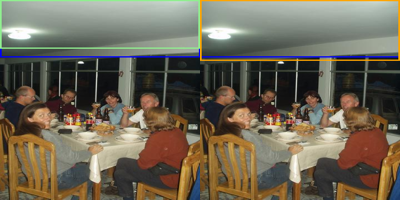

fuck those people


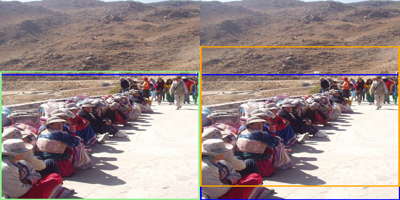

stone walls


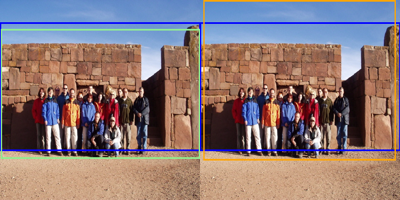

sky


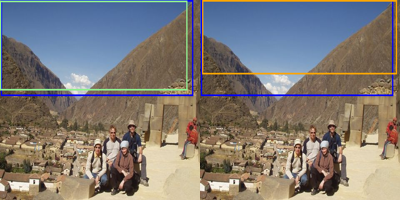

any 1


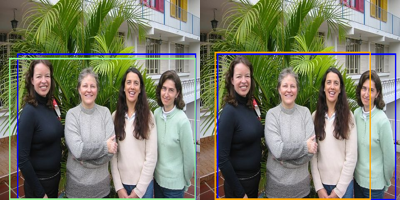

snow


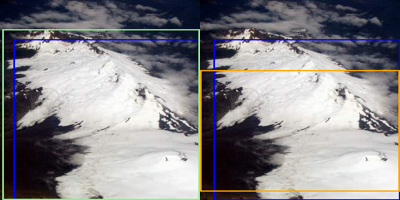

bed


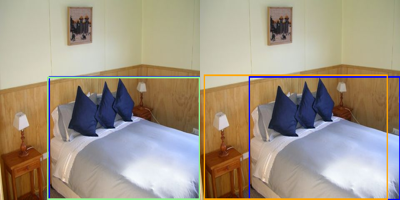

trees


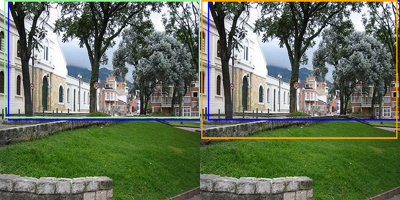

sky


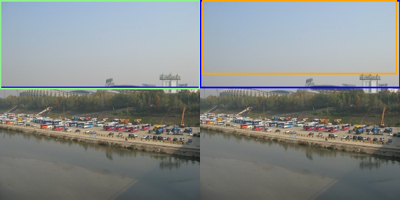

walls


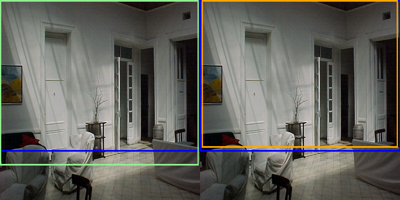

In [50]:
df = df_situation_2.query("spatial == 0 and relational == 0 and ordinal == 0 and intrinsic == 1")
resize_tuple = (200, 200)
df_sample_cls = df.query("0.7 < iou_005 <= 1")
df_sample_cls = df_sample_cls.sample(min(20, df_sample_cls.shape[0]), random_state=42)
for _, row in df_sample_cls.loc[:, ["bbox_raw", "bbox_pred_003", "bbox_pred_005", "img_filename", "expr"]].iterrows():
    im = Image.open(f"{BASE_PATH}{row['img_filename']}")
    im = draw_bounding_boxes(im, [row['bbox_raw']], fmt="xyxy", color="blue", line_width=3)
    im2 = im.copy()
    im = draw_bounding_boxes(im, [row['bbox_pred_003']], fmt="xyxy", color="lightgreen", line_width=3)
    im2 = draw_bounding_boxes(im2, [row['bbox_pred_005']], fmt="xyxy", color="orange", line_width=3)
    im = im.resize(resize_tuple)
    im2 = im2.resize(resize_tuple)
    print(row['expr'])
    get_concat_h(im, im2).show()

Preliminary results after the above observation:

1A: seems like the only-text model can identify left, right, etc, no matter if it does not have visual information. It may contains info regarding which side the bbox should be predicted.

2A: seems like the model only needs references like left, bottom left, etc. The size of the bounding boxes are quite similar, and most of the examples contain big ground truth and big predicted bounding boxes. An example we can discuss is the "group of peoples on bottom left". It's a small predicted bounding box (as small as the ground truth), but maybe the "bottom left" tells the model to predict a small bbox instead of a big one.


To validate the hypotheses, we should load the model and then predict again with more or less text in their expressions (by removing/adding some words) in these examples. Predict and then compare the iou again.